# Final Assignment

## Motivation

We have chosen to dive into a dataset containing information about on-street parking in Melbourne, Australia. 

Melbourne is a smart-city that has made a lot of efford to make their data available to the public. This includes parking data. In Melbourne they have installed sensors to register on-street parking behavior in the city. We thought this dataset would be interesting because it offers a lot of different possibilities to explore the data to the fullest. 

We wish to give the user an overview of the parking possibilities in the city so that they will get an idea of where to park if they want a bigger chance of finding an available parking spot.

## Basic stats

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.pyplot import figure
from folium import plugins
import folium
from folium.plugins import HeatMap
import geopandas as gpd
import json
from shapely.geometry import MultiPolygon

### Loading and intial data filter¶
The data set of On-street Carparking from Melbourne from 2019 (City of Melbourne Open Data Team, 2020) has a size of 7.43 GB. The dataset is very big and we will therefore not be able to load the entire dataset into our assignment. We start out by only reading every 10th line to so we end up with around 1.4 million rows. A sample of 1.4 milion rows is a good sample size of the whole set. We also used some geodata from another dataset of parking bay sensors (City of Melbourne Open Data Team, 2017).

In [3]:
n = 10  # every 100th line = 1% of the lines
df18 = pd.read_csv("On-street_Car_Parking_Sensor_Data_-_2019.csv",skiprows=lambda i: i % n != 0 )
# df19 = pd.read_csv("On-street_Car_Parking_Sensor_Data_-_2018.csv",skiprows=lambda i: i % n != 0 )
senSensorData = pd.read_csv("On-street_Parking_Bay_Sensors.csv")  

### Vizualition and more data filtering

The first issue was na/Nan values, so we dropped those values from the dataframe. We also found out that there was an area name called "All" in the dataset. This did not make sense according to what we wanted to explore with the different areas in the city so that was dropped as well.

When the final filtering was in place, we started to look at how many parkingspots there were in each area to get a feel of the distribuition in the different areas. Docklands quickly jumped to our attention because of the amount of spots in that area. Lookin up the different areas on google it was clear that the Docklands area was the downtown and the center of Melbourne, therefore it makes sense that the most parking spots/parking-basements and parking garages are placed in this area.

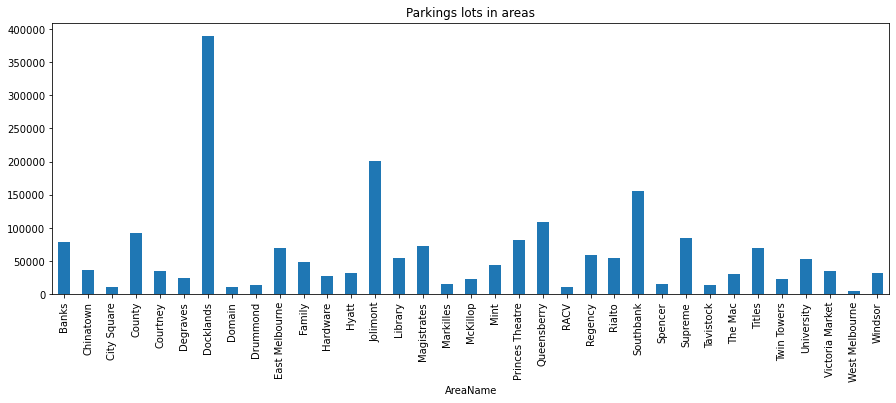

In [4]:
parkingsSpots = df18[['AreaName', 'DeviceId']].dropna()
parkingsSpots = parkingsSpots[parkingsSpots['AreaName']!='All']

spotsInArea =  parkingsSpots['DeviceId'].groupby(parkingsSpots['AreaName']).size()
spotsInArea
figure(figsize= (15,5))
spotsInArea.plot(kind = 'bar', title = "Parkings lots in areas",sharex='True', fig=figure)
plt.show()


### Street names
Next we wanted to explore the data on street level to find out where the most parking spots were placed. Here we didn't find anything noticable other than that Bourke Street is the street with the most parking spots.

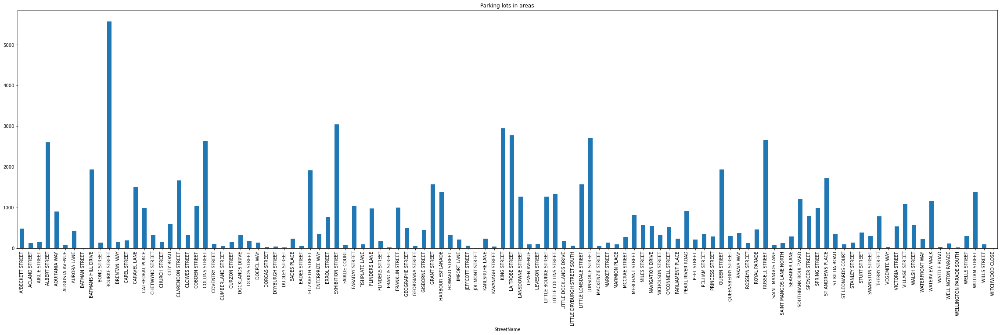

In [10]:
vialationsOnStreets = df18[df18['InViolation']==True].groupby(df18["StreetName"]).size()
vialationsOnStreets
figure(figsize= (40,10))
vialationsOnStreets.plot(kind = 'bar', title = "Parking lots in areas",sharex='True', fig=figure)
plt.show()

### Parking violations
A fun feature of the dataset is that the sensors knows when a car is in violation of the parking spot. And after hearing the podcast referenced in this course we thought it could be interessting to see where most people were violating the parking rules.

After some exporing we didn't find anything mind blowing. The street with the most parking spots was also the street where most cars were in violation which makes sense as there are more parking spots to be used. We also tried to look at the street on Google Maps to see if there was a special reason that cars could be in violation on this street. We saw that on this street there was a time limit on parking of 5-10 minutes. Because of this limit period of time cars parked can very quickly exceed the time limit before leaving again and therefore be registered as in violation.

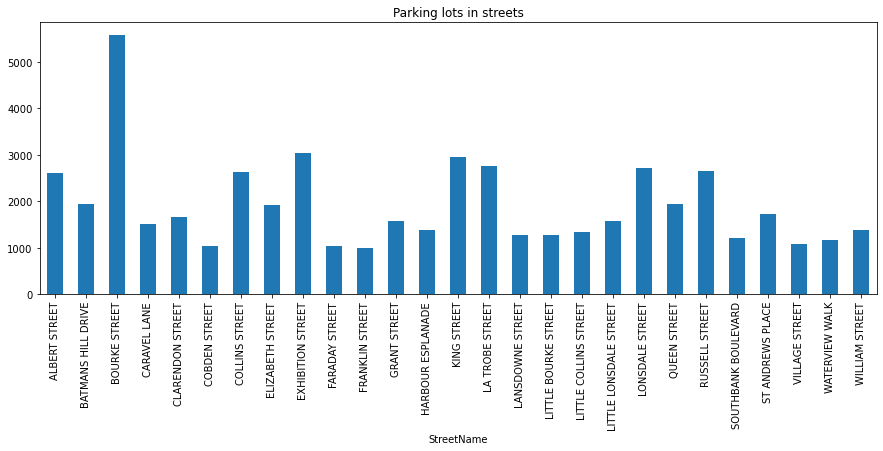

In [13]:
vialationsOnStreetsFilter = df18[df18['InViolation']==True].groupby(df18["StreetName"]).size()
vialationsOnStreetsFilter

vialationsOnStreetsFilter = vialationsOnStreetsFilter[vialationsOnStreetsFilter.values > 1000]

figure(figsize= (15,5))
vialationsOnStreetsFilter.plot(kind = 'bar', title = "Parking lots in streets",sharex='True', fig=figure)
plt.show()

### Area Violation Ratio

We also wanted to see the ratio between the violations and the parking spots. So the area that has the most violations based on how many parking spots in the area gave a different picture. Here Domain was the dominating area with the highest amount of violations based on parking spots.

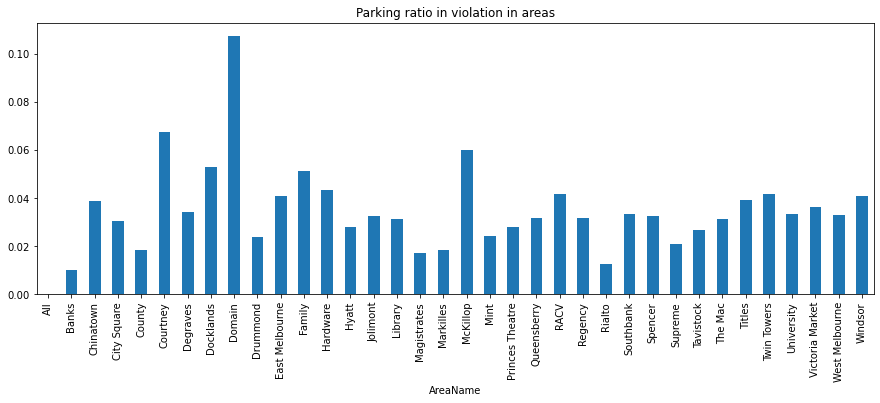

In [12]:
vialationsOnStreets = df18[df18['InViolation']==True].groupby(df18["AreaName"]).size()
ratioTickets = vialationsOnStreets/spotsInArea
figure(figsize= (15,5))
ratioTickets.plot(kind = 'bar', title = "Parking ratio in violation in areas",sharex='True', fig=figure)
plt.show()

### DateTime formatting
Digging into the parking spots on a more speficifc level like hour/day/month we need to do some formatting before creating the plots.


In [14]:
df18['ArrivalTime'] = pd.to_datetime(df18['ArrivalTime'], format="%m/%d/%Y %I:%M:%S %p")
df18['DepartureTime'] = pd.to_datetime(df18['DepartureTime'], format="%m/%d/%Y %I:%M:%S %p")

### Parking spots taken by the hour

To get a quick overview on how the availability of the parking spots changed throughout the day we made a simple bar chart showing that the prime time at 7 and the end at 17 can be hard to get a parking spot. Noticing the spike around midnight made us go back to look for any known issues with the dataset, and lucky for us it was already a known issue:
"There are a number of records where the arrival and departure times have not been recorded. If the time has not been recorded the time is calculated from midnight of the arrival day to either midnight of the departure day or to the departure time." (On-street Car Parking Sensor Data - 2018)

This explains why at midnight a spike can occure because we are using the arrivaltime as indication of when a car has taken a parking spot.

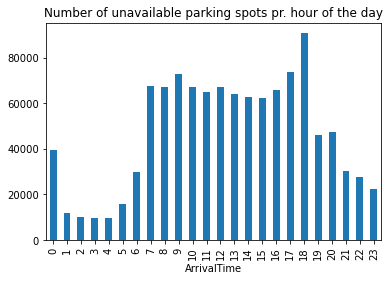

In [15]:
spotTakenDf = df18

crime = spotTakenDf[spotTakenDf['VehiclePresent'] == True].groupby(spotTakenDf['ArrivalTime'].dt.hour).size()
crime.plot(kind = 'bar', title = "Number of unavailable parking spots pr. hour of the day",sharex='True')
plt.show()

### Area parking spots of the day

Next up we took a look at the parking spots taken in the different areas throughout the day. We were looking for interesting areas where it might be easier to find a parking spot on the hour in the different areas.

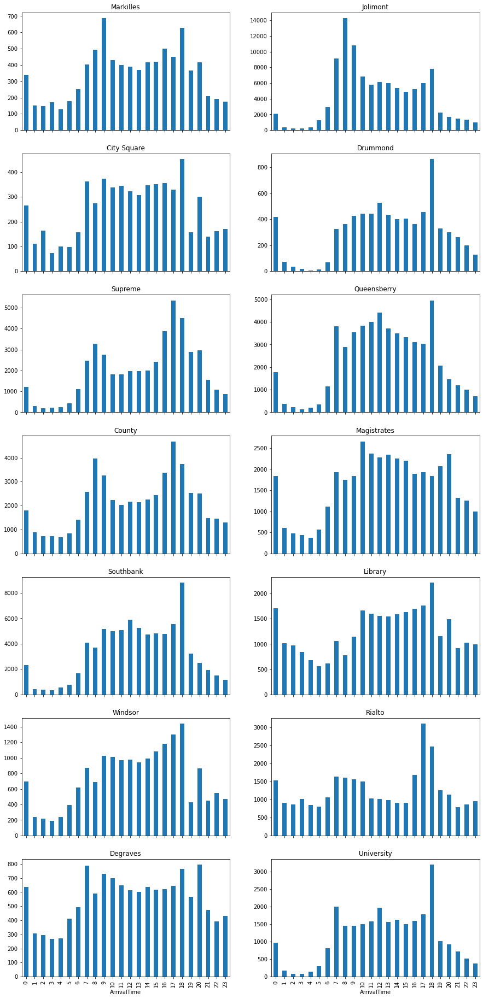

In [16]:
areas = set(['Library', 'Regency', 'Queensberry', 'The Mac', 'Princes Theatre', 'Courtney', 'Drummond', 'Hardware', 'Supreme', 'City Square', 'Domain', 'McKillop', 'Tavistock', 'Degraves', 'Markilles', 'Southbank', 'West Melbourne', 'Victoria Market', 'East Melbourne', 'Spencer', 'Jolimont', 'Docklands', 'Mint', 'Family', 'Twin Towers', 'Hyatt', 'Titles', 'Chinatown', 'County', 'Windsor', 'Magistrates', 'University', 'Rialto', 'Banks'])

a=7
b=2
c=1

weekdays = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

fig = plt.figure(figsize=(15,5))

for x in areas:
    plt.subplot(a,b,c)
    areasub = spotTakenDf[(spotTakenDf['AreaName'] == x) & (spotTakenDf['VehiclePresent'] == True)].groupby(spotTakenDf['ArrivalTime'].dt.hour).size()
    areasub.plot(kind='bar', title = x, sharex = 'True')
    
    c = c + 1
    if c > 14:
        break
plt.subplots_adjust(left=0.125, bottom=0.1, right=0.9, top=5, wspace=0.2, hspace=0.2)
plt.show()

### Area parking spots of the week

Next up we took a look at the parking spots taken in the different areas through out the week. We were again looking for interesting areas where it might be easier to find a parking spot during the week in the different areas. Funny enough in the Victory Market area there were more spots taken in the weekend compared to the weekdays. After some google maps scouting we found that the area is close to shopping possibilities as well as parks (Queen Victoria Market | Melbourne’s Marketplace, 2021). This of course makes people want to go there in the weekends compared to the weekdays. So taking the car to the area in the weekends might not be the best idea if you are used to the spots being available.

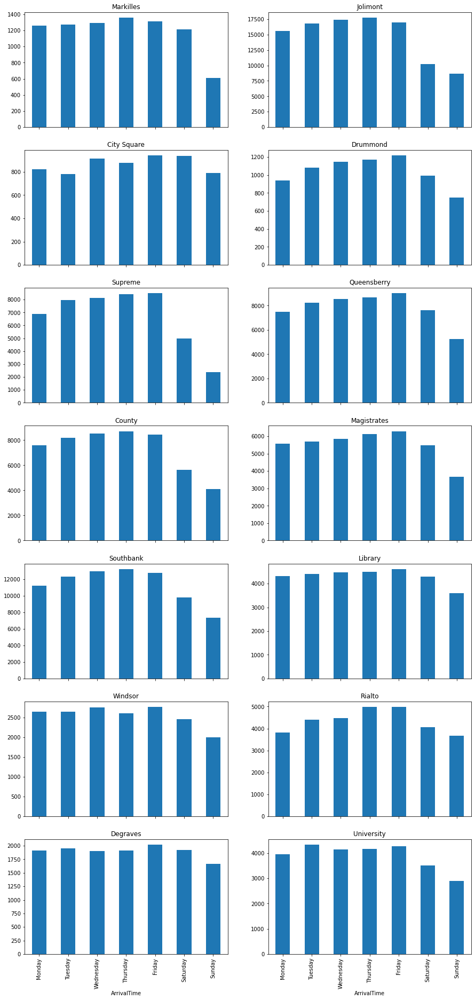

In [17]:
c=1

fig = plt.figure(figsize=(15,5))

for x in areas:
    plt.subplot(a,b,c)
    areasub = spotTakenDf[(spotTakenDf['AreaName'] == x) & (spotTakenDf['VehiclePresent'] == True)].groupby(spotTakenDf['ArrivalTime'].dt.day_name()).size().reindex(weekdays)
    areasub.plot(kind='bar', title = x, sharex = 'True')
    
    c = c + 1
    if c > 14:
        break
plt.subplots_adjust(left=0.125, bottom=0.1, right=0.9, top=5, wspace=0.2, hspace=0.2)
plt.show()

### Area parking spots of the month
Looking at the big picture on a monthly basis, interesting data also got revealed. In janurary there is the most available spots throught out the year and then it starts increasing throught out the year. Here we think of the season in Autralia, which is that janurary is the summer month where people are on vacation (Wikipedia contributors, n.d.) as well as the weather might be nicer. So in Janurary it should be easy to find parking.

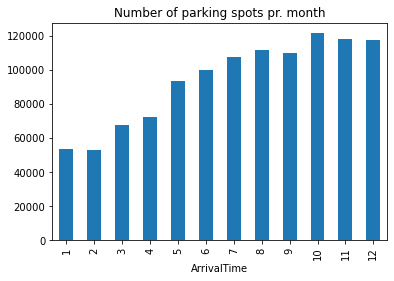

In [18]:
spotTakenDf = df18

crime = spotTakenDf[spotTakenDf['VehiclePresent'] == True].groupby(spotTakenDf['ArrivalTime'].dt.month).size()
crime.plot(kind = 'bar', title = "Number of parking spots pr. month",sharex='True')
plt.show()

In [20]:
spotTakenDf['count'] = 0
spotTakenDf['ArrivalHour'] = spotTakenDf['ArrivalTime'].dt.hour
spotsInArea =  spotTakenDf[spotTakenDf['VehiclePresent'] == False].groupby(['AreaName', 'ArrivalHour'])['count'].size()
spotsInArea = spotsInArea.reset_index()
spotTakenDf['total'] = 0
spotsInAreaTotal =  spotTakenDf[spotTakenDf['VehiclePresent'] == False].groupby(['AreaName'])['total'].size()
spotsInAreaTotal = spotsInAreaTotal.reset_index()
merged = pd.merge(spotsInAreaTotal, spotsInArea, on='AreaName')
merged['mean'] = merged['total'] / merged['count']
merged = merged[merged['AreaName'] != 'All']
merged['mean'] = merged['mean'].apply(np.ceil)
merged['mean'] = merged['mean'].astype(int)

In [29]:
from bokeh.plotting import figure, show
from bokeh.io import output_notebook
import numpy as np
from bokeh.models import ColumnDataSource, FactorRange, Legend

output_notebook()

Loading BokehJS ...

### Preparing bokeh data

Below we make the data ready for an interactive bokeh plot of the different areas on the hourly basis, so the reader can click on an area and see where the most spots are taken.


In [30]:
areas = set(['Banks', 'Chinatown', 'City Square', 'County', 'Courtney', 'Degraves', 'Docklands', 'Domain', 'Drummond', 'East Melbourne','Family', 'Hardware', 'Hyatt', 'Jolimont', 'Library','Magistrates', 'Markilles', 'McKillop', 'Mint', 'Princes Theatre','Queensberry', 'RACV', 'Regency', 'Rialto', 'Southbank', 'Spencer','Supreme', 'Tavistock', 'The Mac', 'Titles', 'Twin Towers','University', 'Victoria Market', 'West Melbourne', 'Windsor'])

dailyHours = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23]
df18['Hours'] = df18['ArrivalTime'].dt.hour
normalizedData = pd.DataFrame(dailyHours, columns = ['Hours'])
sample10 = df18.sample(100000)
sample1=sample10['DeviceId'].groupby(sample10['AreaName']).size()
sample1=sample1.reset_index()
sample=pd.merge(sample1, sample10, on='AreaName')

for c in areas:
    sample[sample['AreaName'] == c]
for x in areas:
    dailyHoursArray = []
    for i in range(0,24):
        dailyHoursArray.append(sample[(sample['AreaName'] == x) & (sample['ArrivalTime'].dt.hour == i) & (sample['VehiclePresent'] == True)].size/sample.loc[sample['AreaName']==x, 'DeviceId_x'].values[0])
    normalizedData[x] = dailyHoursArray


In [31]:
sourceData = ColumnDataSource(normalizedData)

In [32]:
hoursStrings=['1','2','3','4','5','6','7','8','9','10','11','12','13','14','15','16','17','18','19','20','21','22','23']
p = figure(x_range = FactorRange(factors=hoursStrings), x_axis_label = "hour of the day", width = 1500, height = 870, margin = 10)

In [33]:
colorCodes= ['#ff0000', '#ff5e00', '#ffd900', '#c8ff00', '#3cff00', '#00ffb7', '#00eaff', '#005eff', '#7300ff', '#d000ff', '#ff00f7', '#ff006f', '#828282', '#000000', '#ff0000', '#ff5e00', '#ffd900', '#c8ff00', '#3cff00', '#00ffb7', '#00eaff', '#005eff', '#7300ff', '#d000ff', '#ff00f7', '#ff006f', '#828282', '#000000', '#ff0000', '#ff5e00', '#ffd900', '#c8ff00', '#3cff00', '#00ffb7', '#00eaff']
barColumn = {}
items = []

for index, i in enumerate(areas):
    barColumn[i] = p.vbar(x="Hours", top = i, source = sourceData, muted_alpha= 0.05, muted=True, fill_color=colorCodes[index], width=(0.90))
    items.append((i,[barColumn[i]]))

In [34]:
legend = Legend(items = items, location=(0,-30))
p.add_layout(legend, 'left')
p.legend.click_policy="mute"
show(p)

### Preparing bokeh data on weekday basis
This is the second bokeh chart we wanted to make the reader being able to play around with the data themselves.

In [35]:
df18['Hours'] = df18['ArrivalTime'].dt.hour
normalizedData = pd.DataFrame(weekdays, columns = ['Weekdays'])
sample10 = df18.sample(100000)
sample1=sample10['DeviceId'].groupby(sample10['AreaName']).size()
sample1=sample1.reset_index()
sample=pd.merge(sample1, sample10, on='AreaName')
#sample['idCounts'] = np.where(sample['AreaName'] == c, True, False)
for c in areas:
    sample[sample['AreaName'] == c]
for x in areas:
    dailyHoursArray = []
    for i in range(0,7):
        dailyHoursArray.append(sample[(sample['AreaName'] == x) & (sample['ArrivalTime'].dt.day_name() == weekdays[i]) & (sample['VehiclePresent'] == True)].size/sample.loc[sample['AreaName']==x, 'DeviceId_x'].values[0])
    normalizedData[x] = dailyHoursArray

In [36]:
sourceData = ColumnDataSource(normalizedData)

In [37]:
weekdaysStrings=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
pp = figure(x_range = FactorRange(factors=weekdaysStrings), x_axis_label = "weekdays", width = 1000, height = 850, margin = 10)

In [38]:
colorCodes= ['#ff0000', '#ff5e00', '#ffd900', '#c8ff00', '#3cff00', '#00ffb7', '#00eaff', '#005eff', '#7300ff', '#d000ff', '#ff00f7', '#ff006f', '#828282', '#000000', '#ff0000', '#ff5e00', '#ffd900', '#c8ff00', '#3cff00', '#00ffb7', '#00eaff', '#005eff', '#7300ff', '#d000ff', '#ff00f7', '#ff006f', '#828282', '#000000', '#ff0000', '#ff5e00', '#ffd900', '#c8ff00', '#3cff00', '#00ffb7', '#00eaff']
barColumn = {}
items = []

for index, i in enumerate(areas):
    barColumn[i] = pp.vbar(x="Weekdays", top = i, source = sourceData, muted_alpha= 0.05, muted=True, fill_color=colorCodes[index], width=(0.90))
    items.append((i,[barColumn[i]]))

In [39]:
legend = Legend(items = items, location=(0,-30))
pp.add_layout(legend, 'left')
pp.legend.click_policy="mute"
show(pp)

### HeatMap with time

Using the heat map with time was a nice visualizaton we wanted to show the reader to show how it develops through out the day.



In [44]:
geoFile = open("On-street Parking Bays.geojson")
geoData = json.load(geoFile)
dfGeo = pd.json_normalize(geoData['features'])
dfGeo = dfGeo.dropna()
senSensorData.rename(columns = {"st_marker_id": "StreetMarker"}, 
          inplace = True)

In [45]:
resultdf = pd.merge(df18, senSensorData, on='StreetMarker')

In [46]:
resultdfsample = resultdf.sample(10000)
heatsus = [[[row['lat'],row['lon']] for index, row in resultdfsample[resultdfsample['ArrivalTime'].dt.hour == i].iterrows()] for i in range(1,24)]

In [47]:
SFmap = folium.Map([-37.810935, 144.946457], zoom_start=13)
hm = plugins.HeatMapWithTime(heatsus,auto_play=True, max_opacity = 0.8)
hm.add_to(SFmap)
SFmap

Other than the heatmap with time we also wanted to see if we could show a map of the parking spots and color them according to availability. This however, we didn't get that much interesting data out of.

In [49]:
resultdf['marker_color'] = pd.cut((resultdf['VehiclePresent']  == True) & (resultdf['InViolation']  == True), bins=2,                              
                                       labels=[ 'green','red'])

m = folium.Map(
    location=[-37.810935, 144.946457],
    tiles="cartodbpositron",
    zoom_start=13,
)

resultdfsample = resultdf.sample(20000)
for index, row in resultdfsample.iterrows():
       folium.CircleMarker([row['lat'], row['lon']],  radius=2, color=row['marker_color']).add_to(m)
        
m

## Data analysis

The data set is very big. And we quickly got to see why while exploring the rows of the dataset. Each row is generated every time a car it enters a parking spot and everytime it leaves. So to be able to work with this dataset some sampling of the whole dataset was needed.

Once we started exploring the data a lot of our findings made sense according to our hypothesis of how the availability of the parking spots would change during the hours or days. At first the parking data on a monthly basis looked a little bit strange as there were a lot of available parking spots in January. This however, made sense when we found out that this is one of the summer months in Australia and where most people are on vacation.

Another example of an interesting parking metric is the area based on weekdays. The Victory Market has more parking spots taken in the weekend than the businessdays, because it is an area with a park and a shopping center. 

One of the things we learned about the dataset is that a single parking spot can contain a lot of cars therefore a single parking spot like that will have a higher chance of violation. We found out about these kinds of parking spots when we were trying to investigate if a single parking spot had more violations than others. It then came to our attention when going on to Google Maps and we could see that the parking spot with most violations were a very long strip where multiple cars could be parked. It then made sense that there were more violations here as more cars could be parked.

## Genre

For our website we chose to go with a Magazine Style website with a Martini Glass Structure (Segel & Heer, 2010). We did this as we thought it made most sense guiding the readers through what we found. We also wanted the reader to have the oppotunity to explore the data themselves to find out where they should go if they are trying to find a parking spot in the city. Here our webisite starts out in a very Author-driven fashion and then transistions to a Reader-Driven (Segel & Heer, 2010) experience at the end by presenting the reader with two interactive charts.

For our website the tools that we used from the Visual Structuring category of Visual Narrative is Consistent Visual Platform (Segel & Heer, 2010). As we went with the Magazine style this made the most sense as to not confuse the reader. In the highlighting category we used the motion and zooming in our heat-map to keep the attention of the reader. For the Transistion Guidance category we used Object Continuity (Segel & Heer, 2010) by presenting the reader with a lot of the same charts to make sure that the reader got a better understanding of how the visualizations were connected.

Our ordering of the webite is very Linear (Segel & Heer, 2010). We guide the reader from start to finish and the charts are presented in the order that makes sense for the story that we are trying to tell. We use Very Limited Interactivity (Segel & Heer, 2010) as we wanted to show the reader the things that we found interesting and to also introduce the reader to the data before letting them explore for themselves. All the way through the website we use Introductory Text (Segel & Heer, 2010) to explain to the user what we are trying to tell them through the charts.

## Visualizations

We started out by presenting some simple and easy to understand bar-charts to give the reader a general idea of how the data is looking. This we did for the different areas in Melbourne on different levels like hours/weekdays/month illustrating when the most parking spots are taken.

Then we moved on to displaying a Heatmap with time to show how the amount of spots taken changes throughout the day.

At last we present an interactive bokeh chart for the reader to take a look at and see where there should be the least amount of spots taken in a given area for the different hours of the day and the day of the week.

This plays well into the story we are trying to tell about the different areas and the parking spots availability throughout the day and week. Presenting this to the reader they should now have a better idea of where there is a higher probability for a free parking spot in the different areas of Melbourne.

## Discussion
In general it went pretty well finding the story we were looking for which was where to find parking spots in different areas based on weekdays, hour of the day and monthly. We managed to make a nice story with good visualizations using different methods like bar charts, geoData and heatMaps with time, as well as interactive bokeh charts. We would have liked to dig into the parking data of 2020 to see how corona had affected the parking situation. 
We would also have liked to improve on a more detailed level looking at the parking spots with the highest probability of being available on a deviceId level, which represents a single parking bay. But we had difficulties with the different datasets not using the same DeviceId's. 

After all we are satisfied with what we ended up finding out and the narrative we created from it.

## Contributions

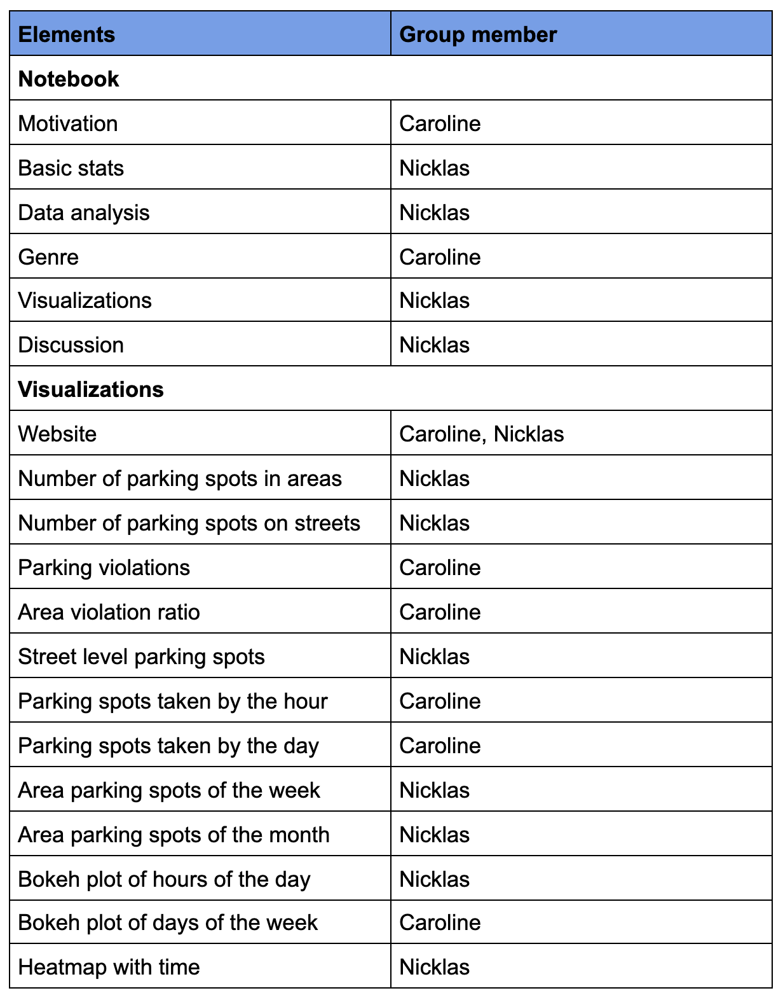

## References

- City of Melbourne Open Data Team. (2017, August 10). On-street Parking Bay Sensors | Open Data | Socrata. City of Melbourne | Open Data. https://data.melbourne.vic.gov.au/Transport/On-street-Parking-Bay-Sensors/vh2v-4nfs


- City of Melbourne Open Data Team. (2020, April 3). On-street Car Parking Sensor Data - 2019 | Open Data | Socrata. City of Melbourne | Open Data. https://data.melbourne.vic.gov.au/Transport/On-street-Car-Parking-Sensor-Data-2019/7pgd-bdf2


- Queen Victoria Market | Melbourne’s Marketplace. (2021, April 29). Queen Victoria Market. https://qvm.com.au/


- Segel, E., & Heer, J. (2010, October). Narrative Visualization: Telling Stories with Data. Stanford University. http://vis.stanford.edu/files/2010-Narrative-InfoVis.pdf


- Wikipedia contributors. (n.d.). Summer vacation. Wikipedia. Retrieved May 10, 2021, from https://en.wikipedia.org/wiki/Summer_vacation#Australia